### Data Loading and Pre-processing

In [1]:
import pandas as pd
import tensorflow as tf
import random
import numpy as np
import matplotlib.pyplot as plt
import os
import requests
from PIL import Image
from io import BytesIO
import pandas as pd
import time
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)
df1 = pd.read_csv("train_cdc.csv")
df1.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [2]:
df1.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,1.620900e+04,1.620900e+04,16209.00000,16209.000000,16209.000000,1.620900e+04,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000,16209.000000
mean,4.575771e+09,5.374703e+05,3.36782,2.113054,2073.274601,1.486767e+04,1.498828,0.006971,0.234253,3.407860,7.652971,1784.754396,288.520205,1971.152755,82.738108,98077.974767,47.560707,-122.214003,1983.152261,12735.572707
std,2.874661e+09,3.603036e+05,0.93327,0.765242,907.009491,3.882570e+04,0.543032,0.083206,0.763152,0.651553,1.171050,821.820844,438.598910,29.372698,397.861148,53.355282,0.138340,0.140093,681.905161,26933.162012
min,1.000102e+06,7.500000e+04,0.00000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.159300,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.200000e+05,3.00000,1.500000,1430.000000,5.004000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1952.000000,0.000000,98033.000000,47.472500,-122.328000,1480.000000,5098.000000
50%,3.904950e+09,4.500000e+05,3.00000,2.250000,1910.000000,7.599000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.572400,-122.230000,1840.000000,7620.000000
75%,7.304301e+09,6.400000e+05,4.00000,2.500000,2550.000000,1.063100e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2200.000000,560.000000,1997.000000,0.000000,98117.000000,47.678200,-122.125000,2360.000000,10053.000000
max,9.900000e+09,7.700000e+06,33.00000,8.000000,12050.000000,1.164794e+06,3.500000,1.000000,4.000000,5.000000,13.000000,8860.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [3]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16209 entries, 0 to 16208
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             16209 non-null  int64  
 1   date           16209 non-null  object 
 2   price          16209 non-null  int64  
 3   bedrooms       16209 non-null  int64  
 4   bathrooms      16209 non-null  float64
 5   sqft_living    16209 non-null  int64  
 6   sqft_lot       16209 non-null  int64  
 7   floors         16209 non-null  float64
 8   waterfront     16209 non-null  int64  
 9   view           16209 non-null  int64  
 10  condition      16209 non-null  int64  
 11  grade          16209 non-null  int64  
 12  sqft_above     16209 non-null  int64  
 13  sqft_basement  16209 non-null  int64  
 14  yr_built       16209 non-null  int64  
 15  yr_renovated   16209 non-null  int64  
 16  zipcode        16209 non-null  int64  
 17  lat            16209 non-null  float64
 18  long  

### Feature Engineering 

In [4]:
df1[[
    "sqft_living",
    "sqft_above",
    "sqft_living15"
]].corr()


,sqft_living,sqft_above,sqft_living15
sqft_living,1.000000,0.875830,0.754931
sqft_above,0.875830,1.000000,0.729625
sqft_living15,0.754931,0.729625,1.000000


In [5]:
missing_indices = [612, 14961, 14962]
df1 = df1.drop(index=missing_indices).reset_index(drop=True)
print(len(os.listdir("sat_images")))
print(len(df1))
df1 = df1.drop(columns=["id","zipcode"])

df1["date"] = pd.to_datetime(df1["date"])
df1["year_sold"] = df1["date"].dt.year
df1["month_sold"] = df1["date"].dt.month
df1 = df1.drop(columns=["date"])

df1["renovated_flag"] = (df1["yr_renovated"] > 0).astype(int)

16206
16206


In [6]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=30, random_state=42)
df1['geo_cluster'] = kmeans.fit_predict(df1[['lat','long']])

In [7]:
df1["house_age"] = (df1["year_sold"] - df1["yr_built"])**2

In [8]:

df1['log_sqft_living'] = np.log1p(df1['sqft_living'])

df1["above_ratio"] = df1["sqft_above"] / df1["sqft_living"]


In [9]:
# Avoid division by zero
eps = 1e-6

# Density proxy
df1['living_to_lot_ratio'] = df1['sqft_living'] / (df1['sqft_lot'] + eps)

In [10]:
df1.to_csv("featured_columns1.csv", index=True)


In [11]:
df1.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year_sold', 'month_sold',
       'renovated_flag', 'geo_cluster', 'house_age', 'log_sqft_living',
       'above_ratio', 'living_to_lot_ratio'],
      dtype='object')

### EDA & Geospatial analysis with financial/visual insights 

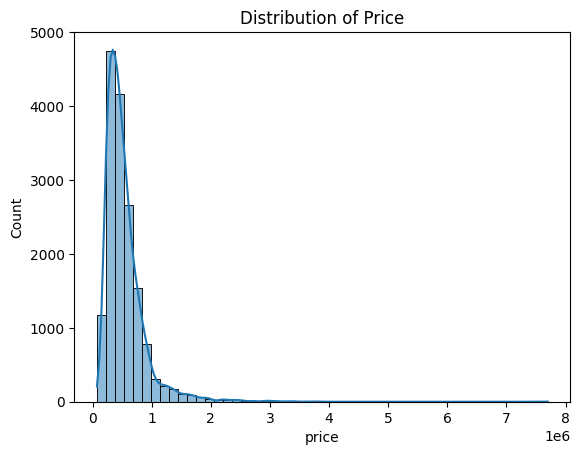

In [12]:
import seaborn as sns 
sns.histplot(df1["price"], kde=True, bins=50)
plt.title("Distribution of Price")
plt.xlabel("price")
plt.show()

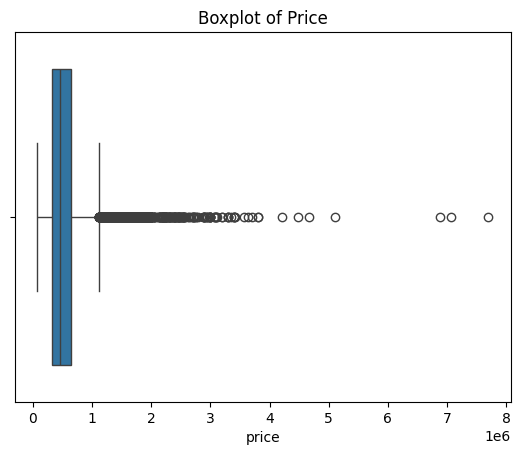

In [13]:
sns.boxplot(x=df1["price"])
plt.title("Boxplot of Price")
plt.show()

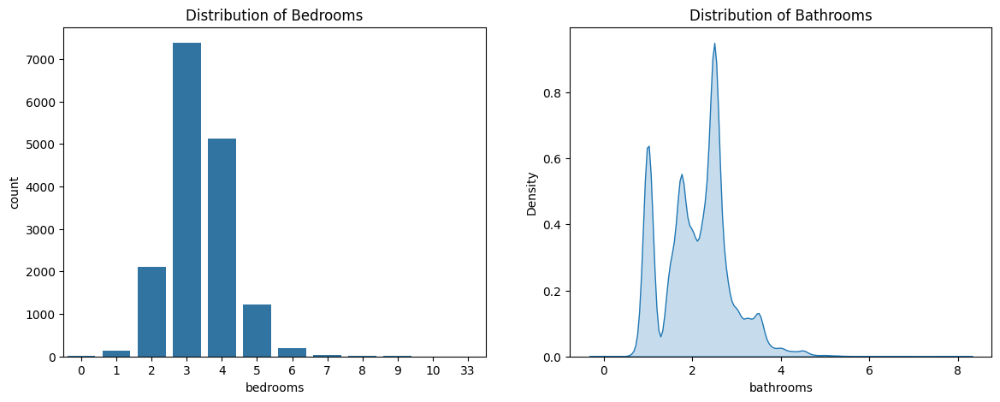

In [14]:
fig, ax = plt.subplots(1,2, figsize=(14,5))

sns.countplot(x="bedrooms", data=df1, ax=ax[0])
ax[0].set_title("Distribution of Bedrooms")

sns.kdeplot(x="bathrooms", data=df1, fill=True, ax=ax[1])
ax[1].set_title("Distribution of Bathrooms")

plt.show()


In [15]:
df1.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year_sold', 'month_sold',
       'renovated_flag', 'geo_cluster', 'house_age', 'log_sqft_living',
       'above_ratio', 'living_to_lot_ratio'],
      dtype='object')

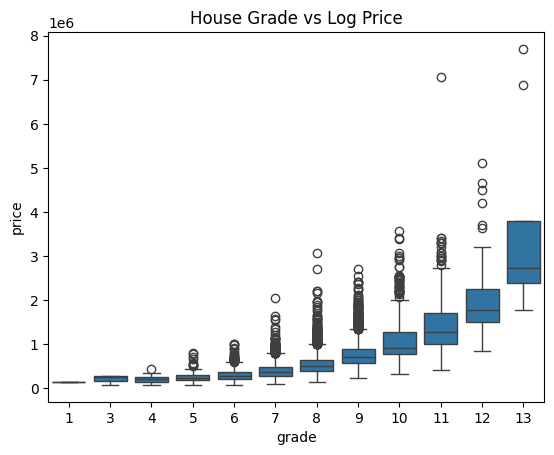

In [16]:
sns.boxplot(x="grade", y="price", data=df1)
plt.title("House Grade vs Log Price")
plt.show()

In [17]:
df1['log_price'] = np.log1p(df1['price'])

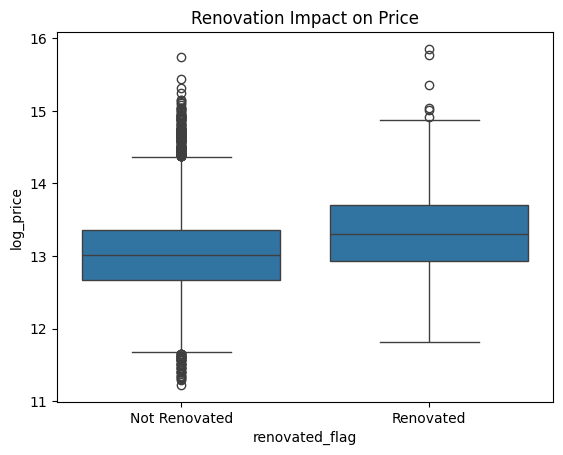

In [18]:
sns.boxplot(x="renovated_flag", y="log_price", data=df1)
plt.xticks([0,1], ["Not Renovated", "Renovated"])
plt.title("Renovation Impact on Price")
plt.show()

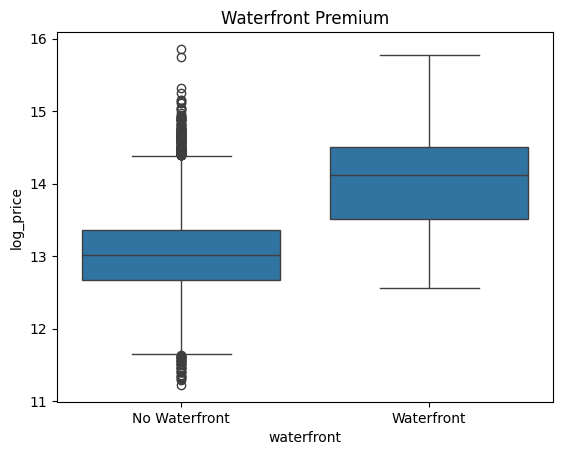

In [19]:
sns.boxplot(x="waterfront", y="log_price", data=df1)
plt.xticks([0,1], ["No Waterfront", "Waterfront"])
plt.title("Waterfront Premium")
plt.show()


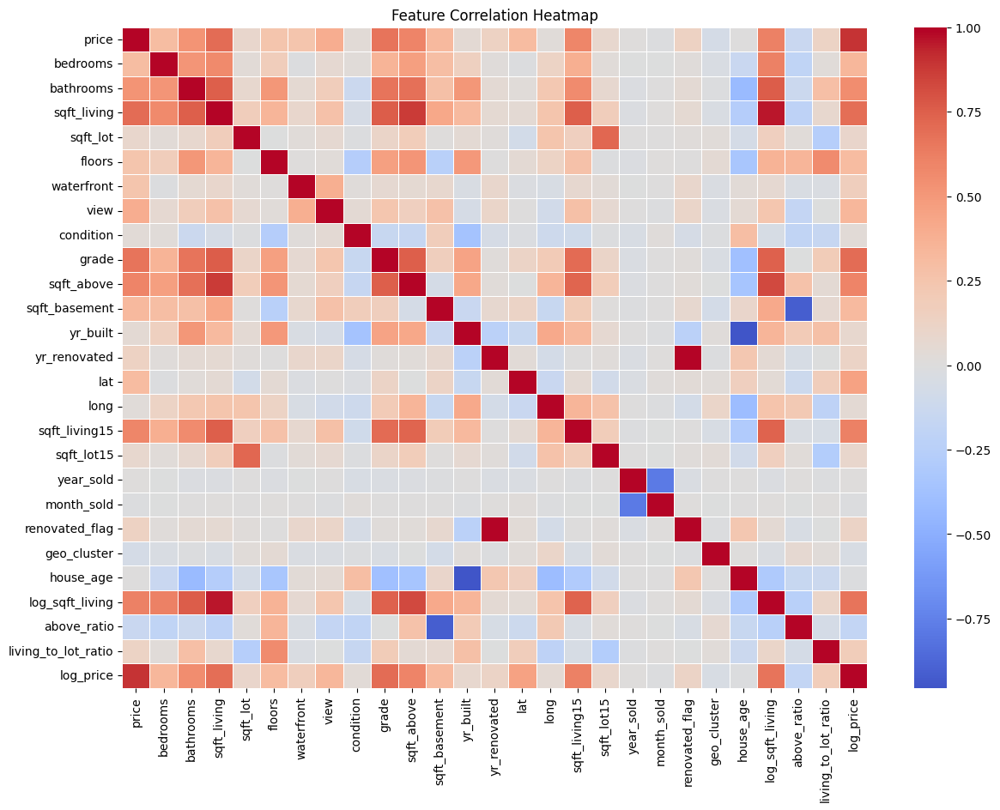

In [20]:
plt.figure(figsize=(14,10))
sns.heatmap(
    df1.corr(),
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)
plt.title("Feature Correlation Heatmap")
plt.show()

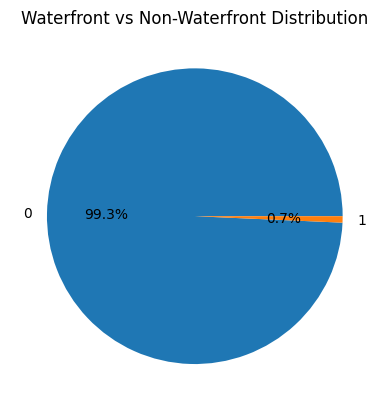

In [21]:
df1["waterfront"].value_counts().plot(
    kind="pie",
    autopct="%1.1f%%"
)
plt.title("Waterfront vs Non-Waterfront Distribution")
plt.ylabel("")
plt.show()

In [23]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_vif = df1.drop(columns=["log_price"]).select_dtypes(include=np.number)
vif_data = pd.DataFrame()
vif_data["feature"] = X_vif.columns
vif_data["VIF"] = [
    variance_inflation_factor(X_vif.values, i)
    for i in range(X_vif.shape[1])
]

vif_data.sort_values("VIF", ascending=False).head(10)

c:\Users\Admin\miniconda3\envs\ragenv\lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
3,sqft_living,inf
10,sqft_above,inf
11,sqft_basement,inf
18,year_sold,1.715608e+06
15,long,1.227113e+06
14,lat,1.552746e+05
12,yr_built,1.213855e+05
13,yr_renovated,1.704560e+04
20,renovated_flag,1.704188e+04
23,log_sqft_living,5.837437e+03


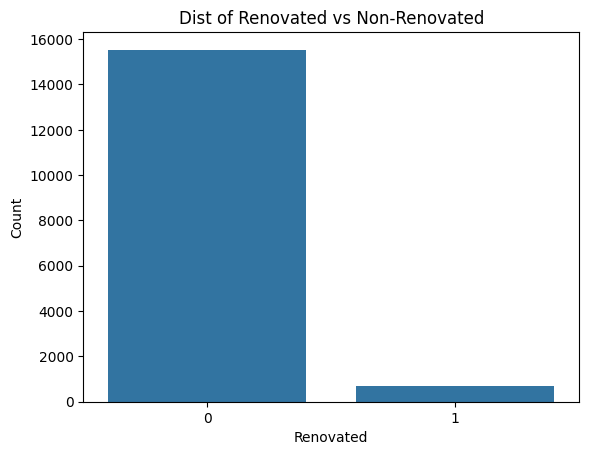

In [24]:
sns.countplot(x="renovated_flag", data=df1)
plt.title("Dist of Renovated vs Non-Renovated")
plt.xlabel("Renovated")
plt.ylabel("Count")
plt.show()



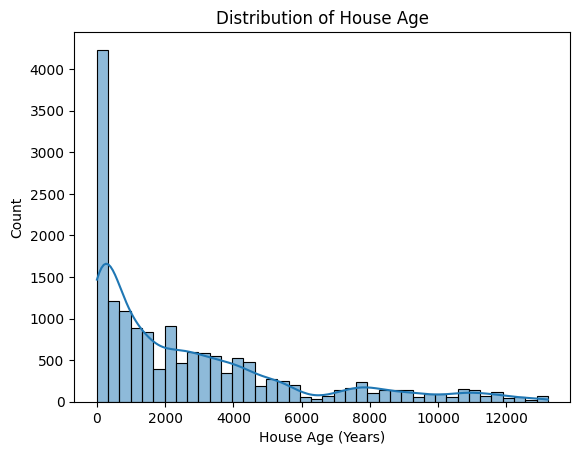

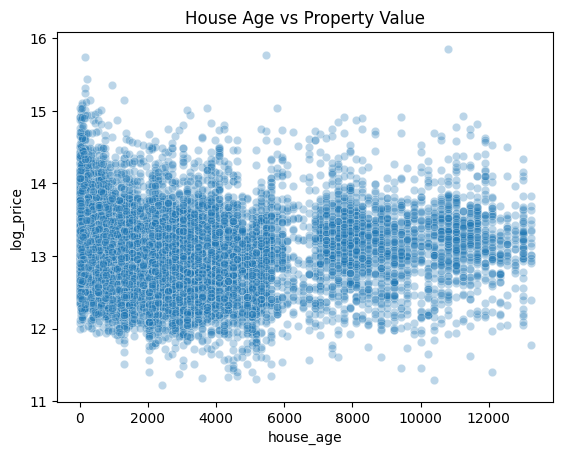

In [25]:
# House Age
sns.histplot(df1["house_age"], bins=40, kde=True)
plt.title("Distribution of House Age")
plt.xlabel("House Age (Years)")
plt.show()

# Relationship with Price
sns.scatterplot(
    x="house_age",
    y="log_price",
    data=df1,
    alpha=0.3
)
plt.title("House Age vs Property Value")
plt.show()


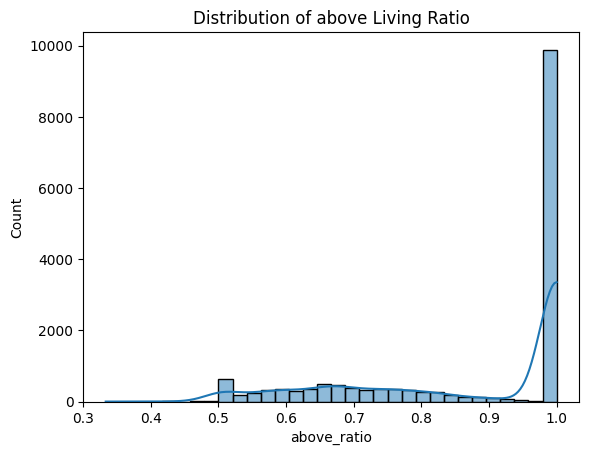

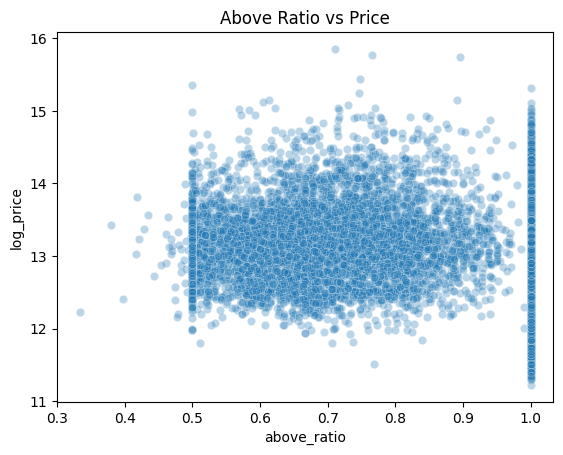

In [26]:
# Above-Ground Ratio (Above-Ground Ratio)
sns.histplot(df1["above_ratio"], kde=True)
plt.title("Distribution of above Living Ratio")
plt.show()
sns.scatterplot(
    x="above_ratio",
    y="log_price",
    data=df1,
    alpha=0.3
)
plt.title("Above Ratio vs Price")
plt.show()


In [27]:
import numpy as np
import pandas as pd

df = df1.copy()

# Price buckets
low_q  = df['price'].quantile(0.2)
high_q = df['price'].quantile(0.8)

def price_bucket(p):
    if p <= low_q:
        return 'low'
    elif p >= high_q:
        return 'high'
    else:
        return 'mid'

df['price_bucket'] = df['price'].apply(price_bucket)

df['price_bucket'].value_counts()


price_bucket
mid     9697
high    3265
low     3244
Name: count, dtype: int64

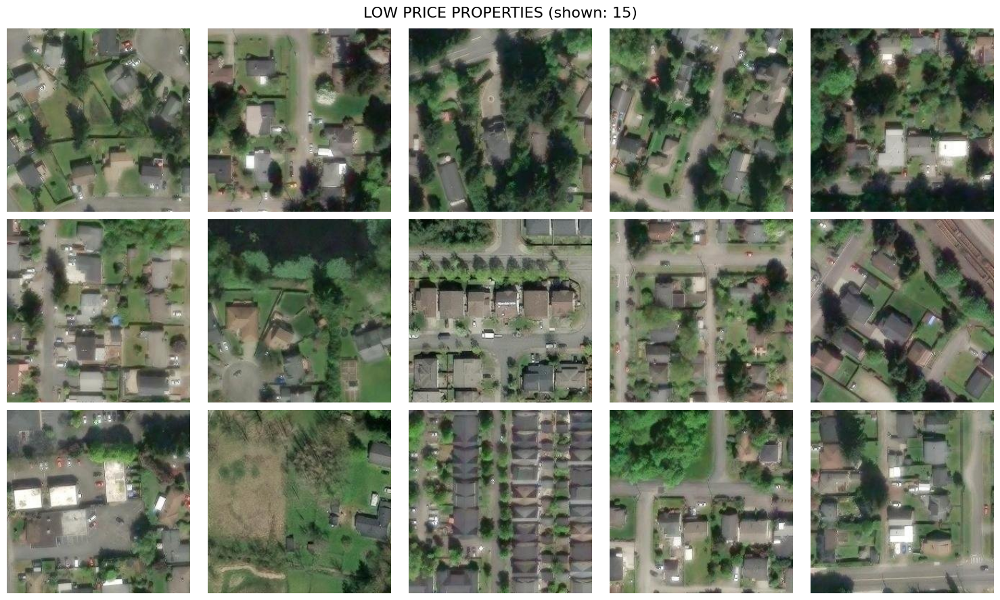

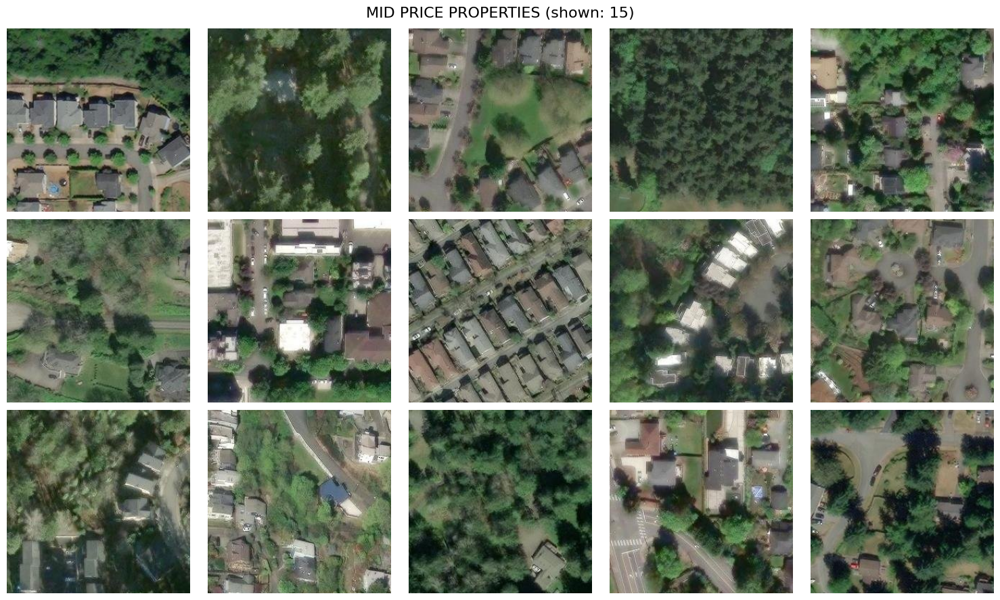

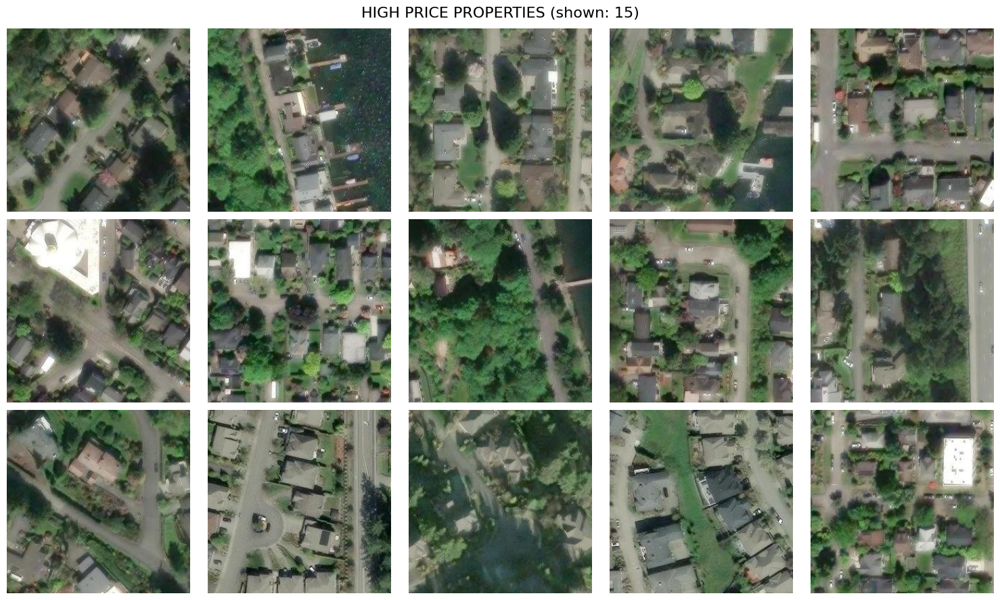

In [28]:
import os
from PIL import Image

IMG_DIR = "sat_images"  # update only if folder name differs

def find_image_path(idx):
    """
    Find image file corresponding to a dataframe index.
    Supports png / jpg / jpeg.
    """
    for ext in [".png", ".jpg", ".jpeg"]:
        path = os.path.join(IMG_DIR, f"{idx}{ext}")
        if os.path.exists(path):
            return path
    return None
import matplotlib.pyplot as plt
import random

def plot_image_grid(indices, title, n_rows=3, n_cols=5):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 9))
    axes = axes.flatten()

    shown = 0
    for ax, idx in zip(axes, indices):
        img_path = find_image_path(idx)

        if img_path is None:
            ax.axis("off")
            continue

        img = Image.open(img_path).convert("RGB")  # ensure RGB
        ax.imshow(img)
        ax.axis("off")
        shown += 1

    plt.suptitle(f"{title} (shown: {shown})", fontsize=16)
    plt.tight_layout()
    plt.show()
for bucket in ["low", "mid", "high"]:
    bucket_indices = df[df['price_bucket'] == bucket].index.tolist()

    # sample safely
    sample_size = min(15, len(bucket_indices))
    sampled_indices = random.sample(bucket_indices, sample_size)

    plot_image_grid(
        sampled_indices,
        title=f"{bucket.upper()} PRICE PROPERTIES"
    )


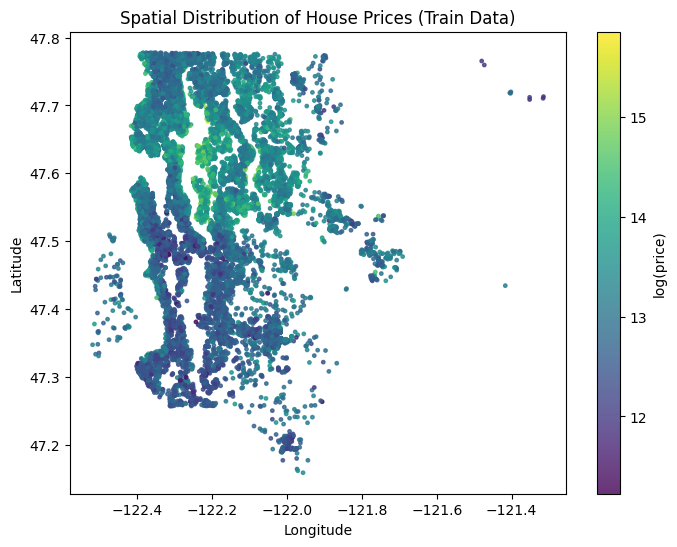

In [29]:
plt.figure(figsize=(8, 6))
plt.scatter(
    df1['long'],
    df1['lat'],
    c=np.log1p(df1['price']),
    cmap='viridis',
    s=6,
    alpha=0.8
)

plt.colorbar(label='log(price)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Spatial Distribution of House Prices (Train Data)")
plt.show()


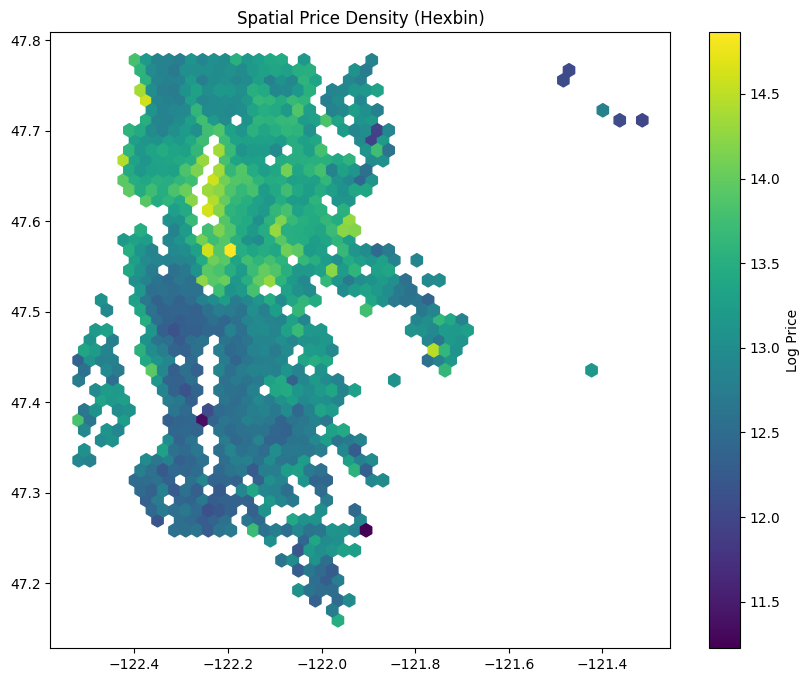

In [30]:
plt.figure(figsize=(10,8))
plt.hexbin(
    df1["long"],
    df1["lat"],
    C=df1["log_price"],
    gridsize=50,
    cmap="viridis"
)
plt.colorbar(label="Log Price")
plt.title("Spatial Price Density (Hexbin)")
plt.show()

### Are CNN image embeddings actually related to price, or is the image gain accidental?

In [31]:
image_embeddings = np.load("image_embeddings.npy")
image_indices = np.load("image_indices.npy")
from sklearn.model_selection import train_test_split

# Split indices
train_idx, temp_idx = train_test_split(
    df1.index,
    test_size=0.30,
    random_state=42
)

val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.50,
    random_state=42
)
standard_cols = [
    "bathrooms",
    "log_sqft_living",
    "sqft_basement",
    "house_age",
    "yr_renovated",
    "grade",
    "sqft_living15",
    "floors",
    "waterfront",
    "view",
    "condition",
    "bedrooms",
    "sqft_lot",
    "sqft_lot15",
    "above_ratio",
]
pass_through_cols = ["lat", "long","renovated_flag",
    "price",# keep long
]
df_train = df1.loc[train_idx].reset_index(drop=True)
df_val   = df1.loc[val_idx].reset_index(drop=True)
df_test  = df1.loc[test_idx].reset_index(drop=True)
X_img_train = image_embeddings[train_idx]
X_img_val   = image_embeddings[val_idx]
X_img_test  = image_embeddings[test_idx]
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

standard_pipe = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
preprocessor = ColumnTransformer(
    transformers=[
        ("std", standard_pipe, standard_cols),
        ("passthrough", "passthrough", pass_through_cols)
    ],
    remainder="drop"
)
X_tab_train_full = preprocessor.fit_transform(df_train)
X_tab_val_full   = preprocessor.transform(df_val)
X_tab_test_full  = preprocessor.transform(df_test)
final_columns = (
    standard_cols +
    pass_through_cols
)

df_tab_train = pd.DataFrame(X_tab_train_full, columns=final_columns)
df_tab_val   = pd.DataFrame(X_tab_val_full,   columns=final_columns)
df_tab_test  = pd.DataFrame(X_tab_test_full,  columns=final_columns)
feature_cols = [c for c in final_columns if c != "price"]

X_tab_train = df_tab_train[feature_cols].values.astype("float32")
X_tab_val   = df_tab_val[feature_cols].values.astype("float32")
X_tab_test  = df_tab_test[feature_cols].values.astype("float32")

y_train = df_tab_train["price"].values.astype("float32")
y_val   = df_tab_val["price"].values.astype("float32")
y_test  = df_tab_test["price"].values.astype("float32")

In [32]:
from scipy.stats import pearsonr

log_price = np.log1p(y_train)

n_dims = X_img_train.shape[1]
corrs = np.zeros(n_dims, dtype=np.float32)

for i in range(n_dims):
    r, _ = pearsonr(X_img_train[:, i], log_price)
    corrs[i] = abs(r)



In [33]:
TOP_K = 10
top_dims = np.argsort(corrs)[-TOP_K:][::-1]

top_dims, corrs[top_dims]


(array([1584, 1895,  911, 1413,   60, 1009, 1184,  806,  867,  109]),
 array([0.22817451, 0.22024393, 0.21728921, 0.21712363, 0.21543661,
        0.21190181, 0.20527793, 0.20282464, 0.20113376, 0.19892564],
       dtype=float32))

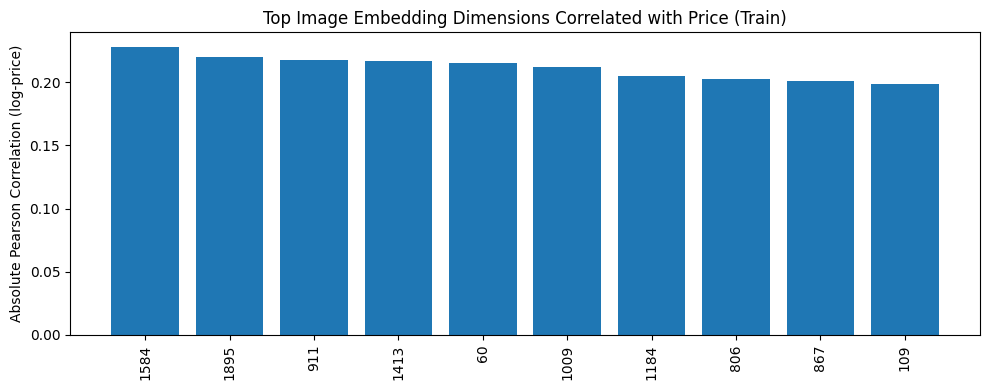

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.bar(range(TOP_K), corrs[top_dims])
plt.xticks(range(TOP_K), top_dims, rotation=90)
plt.ylabel("Absolute Pearson Correlation (log-price)")
plt.title("Top Image Embedding Dimensions Correlated with Price (Train)")
plt.tight_layout()
plt.show()


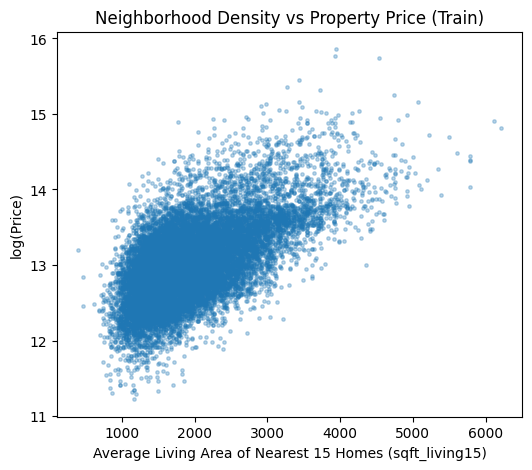

In [35]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(6, 5))
plt.scatter(
    df1['sqft_living15'],
    np.log1p(df1['price']),
    alpha=0.3,
    s=6
)

plt.xlabel("Average Living Area of Nearest 15 Homes (sqft_living15)")
plt.ylabel("log(Price)")
plt.title("Neighborhood Density vs Property Price (Train)")
plt.show()


In [36]:
y_train_log = np.log1p(y_train)
y_val_log = np.log1p(y_val)

In [37]:
from xgboost import XGBRegressor
xgb_model1 = XGBRegressor(
    n_estimators=250,
    max_depth=7,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    tree_method="hist",
    random_state=42,
    eval_metric="rmse",   # or "mae" / "mape" / "logloss" etc.
)
from xgboost import XGBRegressor
from xgboost.callback import EarlyStopping
xgb_model1.fit(
    X_tab_train,
    y_train_log,
    eval_set=[(X_tab_val, y_val_log)],
    verbose=50
)
from sklearn.metrics import mean_squared_error, r2_score

# Predict log(price)
y_test_pred_log = xgb_model1.predict(X_tab_test)

# Back to original scale
y_test_pred = np.expm1(y_test_pred_log)

rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

print("XGBoost RMSE:", rmse)
print("XGBoost R2:", r2)

[0]	validation_0-rmse:0.50820
[50]	validation_0-rmse:0.18395
[100]	validation_0-rmse:0.16520
[150]	validation_0-rmse:0.16270
[200]	validation_0-rmse:0.16197
[249]	validation_0-rmse:0.16178
XGBoost RMSE: 114048.73175971753
XGBoost R2: 0.8956955671310425


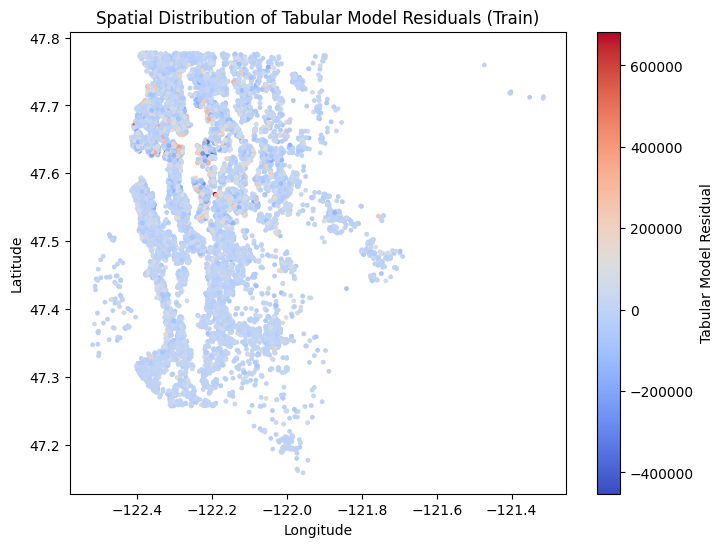

In [38]:
# Predict on train (log space)
y_train_pred_log = xgb_model1.predict(X_tab_train)
y_train_pred = np.expm1(y_train_pred_log)

# Residuals
df_train['residual_tab'] = df_train['price'] - y_train_pred
plt.figure(figsize=(8,6))
plt.scatter(
    df_train['long'],
    df_train['lat'],
    c=df_train['residual_tab'],
    cmap='coolwarm',
    s=6
)
plt.colorbar(label="Tabular Model Residual")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Spatial Distribution of Tabular Model Residuals (Train)")
plt.show()


In [39]:
import numpy as np

# Compute embedding L2 norm
embedding_norm = np.linalg.norm(X_img_train, axis=1)

df_train["img_embedding_norm"] = embedding_norm

# Compare distributions
norm_stats = (
    df_train
    .groupby("waterfront")["img_embedding_norm"]
    .describe()[["mean", "std"]]
)

norm_stats


,mean,std
waterfront,,
0,24.065594,2.712682
1,22.761839,2.598635


<Figure size 600x400 with 0 Axes>

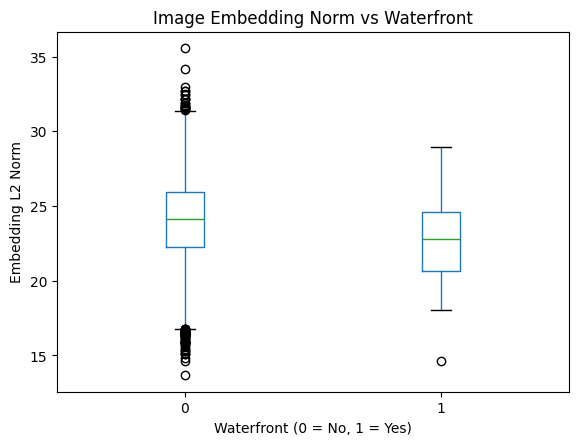

In [40]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
df_train.boxplot(
    column="img_embedding_norm",
    by="waterfront",
    grid=False
)
plt.title("Image Embedding Norm vs Waterfront")
plt.suptitle("")
plt.xlabel("Waterfront (0 = No, 1 = Yes)")
plt.ylabel("Embedding L2 Norm")
plt.show()


### gradcam

In [41]:
import numpy as np
from PIL import Image
from tensorflow.keras.applications.inception_v3 import preprocess_input

def load_and_preprocess_image(path):
    """
    Input : path to 256x256 JPG image
    Output: (299, 299, 3) float32 tensor ready for Inception-v3
    """
    img = Image.open(path).convert("RGB")   
    img = img.resize((299, 299), Image.BICUBIC)      
    img = np.array(img).astype("float32")            
    img = preprocess_input(img)                      
    return img

In [42]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

image_input = Input(shape=(299, 299, 3))

base_model = InceptionV3(
    weights="imagenet",
    include_top=False,
    pooling="avg"
)

base_model.trainable = False

feature_extractor = Model(image_input, base_model(image_input))


In [43]:

for layer in base_model.layers[::-1]:
    if len(layer.output.shape) == 4:
        print("Last conv layer:", layer.name)
        break


Last conv layer: mixed10


In [44]:


last_conv_layer_name = "mixed10"

grad_model = tf.keras.models.Model(
    inputs=base_model.input,
    outputs=[
        base_model.get_layer(last_conv_layer_name).output,
        base_model.output
    ]
)


In [45]:
import numpy as np

def compute_gradcam(img_tensor, grad_model):
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_tensor)
        loss = tf.reduce_mean(predictions)

    grads = tape.gradient(loss, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap /= tf.reduce_max(heatmap) + 1e-8

    return heatmap.numpy()


In [46]:

import cv2
def overlay_gradcam(img_path, heatmap, alpha=0.4):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (299, 299))

    heatmap = cv2.resize(heatmap, (299, 299))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(6, 3))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM")
    plt.imshow(overlay)
    plt.axis("off")
    plt.show()


In [47]:

def batch_gradcam(image_paths, grad_model):
    heatmaps = []

    for path in image_paths:
        img = load_and_preprocess_image(path)
        img = np.expand_dims(img, axis=0)

        heatmap = compute_gradcam(img, grad_model)
        heatmaps.append(heatmap)

    return np.array(heatmaps)


In [48]:
import random

IMG_DIR = "sat_images"
all_images = [os.path.join(IMG_DIR, f) for f in os.listdir(IMG_DIR)]

sample_paths = random.sample(all_images, 50) 
heatmaps = batch_gradcam(sample_paths, grad_model)


In [49]:
import cv2
def show_random_gradcam_images(image_paths, grad_model, n_show=10):
    chosen_paths = random.sample(image_paths, n_show)

    plt.figure(figsize=(12, 3 * n_show))

    for i, img_path in enumerate(chosen_paths):
        img = load_and_preprocess_image(img_path)
        img_batch = np.expand_dims(img, axis=0)

        heatmap = compute_gradcam(img_batch, grad_model)

        orig = cv2.imread(img_path)
        orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
        orig = cv2.resize(orig, (299, 299))
        heatmap_resized = cv2.resize(heatmap, (299, 299))
        heatmap_color = cv2.applyColorMap(
            np.uint8(255 * heatmap_resized),
            cv2.COLORMAP_JET
        )

        overlay = cv2.addWeighted(orig, 0.6, heatmap_color, 0.4, 0)
        plt.subplot(n_show, 2, 2*i + 1)
        plt.imshow(orig)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(n_show, 2, 2*i + 2)
        plt.imshow(overlay)
        plt.title("Grad-CAM")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

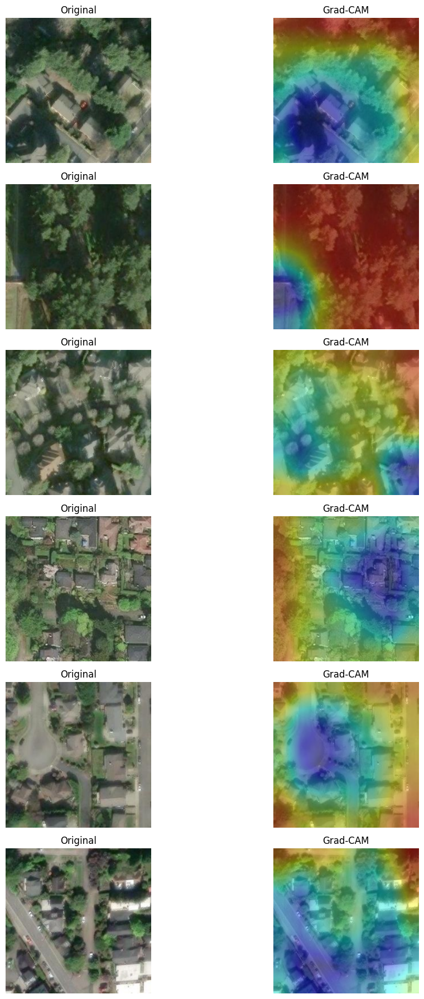

In [50]:
show_random_gradcam_images(sample_paths, grad_model, n_show=6)



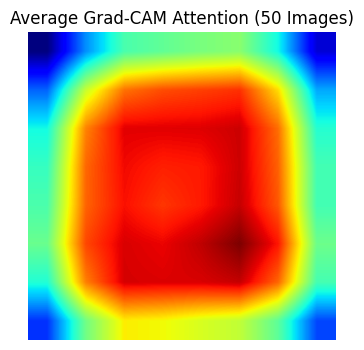

In [51]:
mean_heatmap = np.mean(heatmaps, axis=0)
mean_heatmap_resized = cv2.resize(mean_heatmap, (299, 299))

plt.figure(figsize=(4, 4))
plt.title("Average Grad-CAM Attention (50"
" Images)")
plt.imshow(mean_heatmap_resized, cmap="jet")
plt.axis("off")
plt.show()